In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)


## Import Data 
- Getting Data 
- Unzip data

In [2]:
! wget -P ../../data/raw https://www.kaggle.com/becksddf/churn-in-telecoms-dataset

--2020-10-19 11:43:57--  https://www.kaggle.com/becksddf/churn-in-telecoms-dataset
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘../../data/raw/churn-in-telecoms-dataset.2’

churn-in-telecoms-d     [ <=>                ]  50.11K  --.-KB/s    in 0.09s   

2020-10-19 11:43:58 (549 KB/s) - ‘../../data/raw/churn-in-telecoms-dataset.2’ saved [51310]



In [3]:
! unzip -o ../../data/raw/"bigml_59c28831336c6604c800002a.csv.zip"

unzip:  cannot find or open ../../data/raw/bigml_59c28831336c6604c800002a.csv.zip, ../../data/raw/bigml_59c28831336c6604c800002a.csv.zip.zip or ../../data/raw/bigml_59c28831336c6604c800002a.csv.zip.ZIP.


## Making Data Frame and Cleaning the Data

In [4]:
df = pd.read_csv('../../data/raw/bigml_59c28831336c6604c800002a.csv')

In [5]:
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


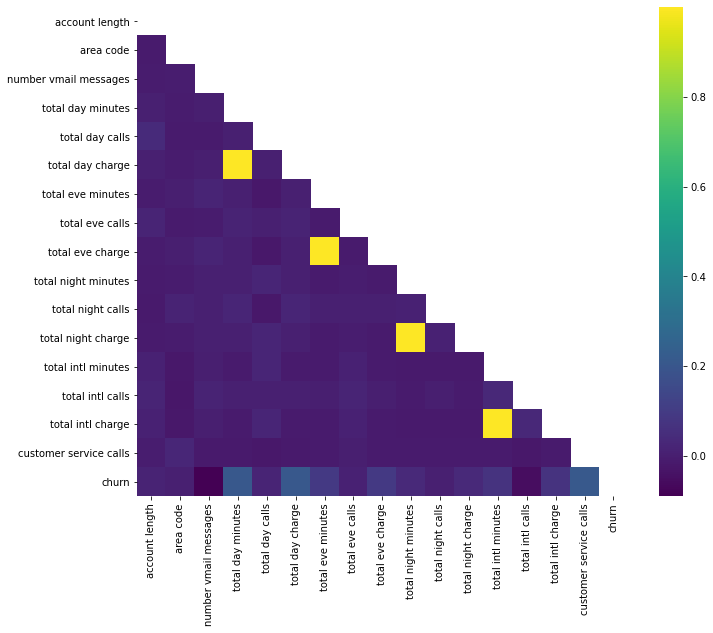

In [58]:
import seaborn as sns
corr = df.corr()
# The mask is not necessary, but corr() has duplicate values on either side of the diagonal
mask = np.triu(np.ones_like(corr, dtype=np.bool))

fig1, ax1 = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, mask=mask, ax=ax1, cmap="viridis");

In [6]:
df.isna().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

In [7]:
df.churn.value_counts()

False    2850
True      483
Name: churn, dtype: int64

In [8]:
df.shape

(3333, 21)

In [9]:
df.duplicated().value_counts()

False    3333
dtype: int64

In [10]:
df['churn'] = df['churn'].astype(int)
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [11]:
#import seaborn as sns

#sns.pairplot(df);

## Making Target 

In [12]:
df.churn.value_counts()
X= df.drop('churn', axis=1)
y = df.churn

In [13]:
X.dtypes.value_counts()

float64    8
int64      8
object     4
dtype: int64

In [14]:
df.churn.value_counts()

0    2850
1     483
Name: churn, dtype: int64

## Train Test Split

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=.2)
print(X_train.shape)
print(y_train.shape)

(2666, 20)
(2666,)


In [16]:
X_train.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls'],
      dtype='object')

## First Simple Model
- based on only numerical columns
- isolating numerical by excluding objects( non-numerical)

In [19]:
X_tr_num = X_train.drop(['state', 'area code', 'phone number', 'international plan', 'voice mail plan'], axis=1)
X_tr_num

,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
817,243,0,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,6.6,6,1.78,2
1373,108,0,112.0,105,19.04,193.7,110,16.46,208.9,93,9.40,4.1,4,1.11,4
679,75,0,222.4,78,37.81,327.0,111,27.80,208.0,104,9.36,8.7,9,2.35,1
56,141,0,126.9,98,21.57,180.0,62,15.30,140.8,128,6.34,8.0,2,2.16,1
1993,86,0,216.3,96,36.77,266.3,77,22.64,214.0,110,9.63,4.5,3,1.22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,106,0,274.4,120,46.65,198.6,82,16.88,160.8,62,7.24,6.0,3,1.62,1
1130,122,0,35.1,62,5.97,180.8,89,15.37,251.6,58,11.32,12.7,2,3.43,1
1294,66,0,87.6,76,14.89,262.0,111,22.27,184.6,125,8.31,9.2,5,2.48,1
860,169,0,179.2,111,30.46,175.2,130,14.89,228.6,92,10.29,9.9,6,2.67,2


In [20]:
X_tr_num.dtypes.value_counts()

float64    8
int64      7
dtype: int64

## Scaling Training Tests 

In [21]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
X_train_sc = pd.DataFrame(ss.fit_transform(X_tr_num), index=X_tr_num.index, columns=X_tr_num.columns)
X_train_sc

,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
817,3.601382,-0.584936,-1.547653,-0.429657,-1.547170,-0.729987,-1.840891,-0.731087,1.255804,0.925634,1.256197,-1.300791,0.634849,-1.304132,0.318978
1373,0.184951,-0.584936,-1.244014,0.224176,-1.244071,-0.138082,0.499864,-0.139179,0.165090,-0.353704,0.164841,-2.194793,-0.184370,-2.191525,1.813519
679,-0.650176,-0.584936,0.787609,-1.133785,0.787772,2.491952,0.549667,2.493068,0.147339,0.209205,0.147309,-0.549828,1.863677,-0.549186,-0.428293
56,1.020079,-0.584936,-0.969818,-0.127888,-0.970200,-0.408385,-1.890695,-0.408439,-1.178086,1.437368,-1.176344,-0.800149,-1.003589,-0.800835,-0.428293
1993,-0.371801,-0.584936,0.675354,-0.228477,0.675192,1.294330,-1.143645,1.295326,0.265680,0.516246,0.265649,-2.051753,-0.593980,-2.045833,-1.175564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.134337,-0.584936,1.744532,0.978599,1.744697,-0.041404,-0.894629,-0.041689,-0.783614,-1.940082,-0.781878,-1.515351,-0.593980,-1.516047,-0.428293
1130,0.539248,-0.584936,-2.659156,-1.938502,-2.658892,-0.392601,-0.546006,-0.392191,1.007287,-2.144776,1.006369,0.880576,-1.003589,0.881237,-0.428293
1294,-0.877938,-0.584936,-1.693032,-1.234374,-1.693306,1.209490,0.549667,1.209441,-0.314193,1.283848,-0.312901,-0.371028,0.225239,-0.377006,-0.428293
860,1.728672,-0.584936,-0.007374,0.525945,-0.007862,-0.503090,1.495930,-0.503609,0.553644,-0.404877,0.554924,-0.120707,0.634849,-0.125357,0.318978


## FSM with logistic, with Only Numeric

In [92]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, precision_recall_curve, auc, make_scorer, recall_score, accuracy_score, precision_score, confusion_matrix
lg = LogisticRegression()
lg.fit(X_train_sc, y_train )
lg.score(X_train_sc, y_train)

0.8570892723180795

In [23]:
cross_val_score(LogisticRegression(), X_train_sc, y_train, cv=3, scoring='f1')

array([0.12987013, 0.22222222, 0.09929078])

## Hyperparameter Tuning on Logistic 

In [121]:
cross_val_score(LogisticRegression(C=.1, class_weight='balanced'), X_train_sc, y_train, cv=3, scoring='f1')

array([0.37708831, 0.39035088, 0.40559441])

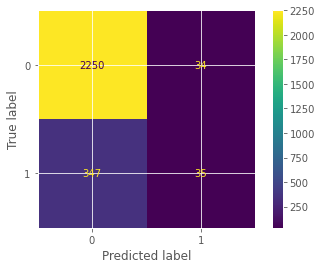

In [122]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt

plot_confusion_matrix(lg, X_train_sc, y_train)

log regression with lasso

In [79]:
cross_val_score(LogisticRegression(C=.01, class_weight='balanced',penalty='l1',solver='liblinear'), X_train_sc, y_train, cv=3, scoring='f1')

array([0.35047619, 0.36162362, 0.33761468])

In [103]:
lr = LogisticRegression(C=.01, class_weight='balanced',penalty='l1',solver='liblinear')
lr.fit(X_train_sc, y_train )
lr.score(X_train_sc, y_train)
#lr.coef_

0.6219054763690923

In [77]:
X_train_sc.columns

Index(['account length', 'number vmail messages', 'total day minutes',
       'total day calls', 'total day charge', 'total eve minutes',
       'total eve calls', 'total eve charge', 'total night minutes',
       'total night calls', 'total night charge', 'total intl minutes',
       'total intl calls', 'total intl charge', 'customer service calls'],
      dtype='object')

In [78]:
for cf,c in zip(lr.coef_[0], X_train_sc.columns):
    print(cf,c)

0.0 account length
-0.06541470686108719 number vmail messages
0.09363512035564597 total day minutes
0.0 total day calls
0.2763880675030875 total day charge
0.0566257145079835 total eve minutes
0.0 total eve calls
0.0 total eve charge
0.0 total night minutes
0.0 total night calls
0.0 total night charge
0.01163075022626277 total intl minutes
-0.009452031920821039 total intl calls
0.060353673414083236 total intl charge
0.38885773674227603 customer service calls


In [ ]:
#X_train_sc

In [176]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')

X_tr_cat = X_train.drop(['phone number'], axis=1)

X_tr_oh = pd.DataFrame(ohe.fit_transform(X_tr_cat), columns=ohe.get_feature_names(X_tr_cat.columns), index=X_tr_cat.index)
X_tr_final = X_train_sc.join(X_tr_oh)


In [177]:
X_tr_final

,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,state_AK,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_IA,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,account length_1,account length_3,account length_5,account length_6,account length_7,account length_9,account length_10,account length_11,account length_12,account length_13,account length_15,account length_16,account length_17,account length_18,account length_19,account length_20,account length_21,account length_22,account length_23,account length_24,account length_25,account length_26,account length_27,account length_28,account length_29,account length_30,account length_31,account length_32,account length_33,account length_34,account length_35,account length_36,account length_37,account length_38,account length_39,account length_40,account length_41,account length_42,account length_43,account length_44,account length_45,account length_46,account length_47,account length_48,account length_49,account length_50,account length_51,account length_52,account length_53,account length_54,account length_55,account length_56,account length_57,account length_58,account length_59,account length_60,account length_61,account length_62,account length_63,account length_64,account length_65,account length_66,account length_67,account length_68,account length_69,account length_70,account length_71,account length_72,account length_73,account length_74,account length_75,account length_76,account length_77,account length_78,account length_79,account length_80,account length_81,account length_82,account length_83,account length_84,account length_85,account length_86,account length_87,account length_88,account length_89,account length_90,account length_91,account length_92,account length_93,account length_94,account length_95,account length_96,account length_97,account length_98,account length_99,account length_100,account length_101,account length_102,account length_103,account length_104,account length_105,account length_106,account length_107,account length_108,account length_109,account length_110,account length_111,account length_112,account length_113,account length_114,account length_115,account length_116,account length_117,account length_118,account length_119,account length_120,account length_121,account length_122,account length_123,account length_124,account length_125,account length_126,account length_127,account length_128,account length_129,account length_130,account length_131,account length_132,account length_133,account length_134,account length_135,account length_136,account length_137,account length_138,account length_139,account length_140,account length_141,account length_142,account length_143,account length_144,account length_145,account length_146,account length_147,account length_148,account length_149,account length_150,account length_151,account length_152,account length_153,account length_154,account length_155,account length_156,account length_157,account length_158,account length_159,account length_160,account length_161,account length_162,account length_163,account length_164,account length_165,account length_166,account length_167,account length_168,account length_169,account length_170,account length_171,account length_172,account length_173,account length_174,account length_175,account length_176,account length_177,account length_178,account length_179,account length_180,account length_181,accou

## Second LogisticRegression

In [178]:
lr1 = LogisticRegression(C=.01, class_weight='balanced',penalty='l1',solver='liblinear')
lr.fit(X_tr_final, y_train )
lr.score(X_tr_final, y_train)

0.7509377344336085

In [179]:
cross_val_score(LogisticRegression(C=.01, class_weight='balanced',penalty='l1',solver='liblinear'), X_tr_final, y_train, cv=3)

array([0.71653543, 0.71316085, 0.68355856])

## Smote and PipeLine  
- using the second logisticregression model as the best model to creat final scoring 

In [180]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
sm = SMOTE()
X_train_res, y_train_res = sm.fit_sample(X_tr_final, y_train.ravel())

In [181]:

pipe_log = Pipeline([('sampling', SMOTE()), ('scaling', StandardScaler()),('classification', LogisticRegression())])

In [182]:
pipe_log.fit(X_tr_final, y_train)

Pipeline(steps=[('sampling', SMOTE()), ('scaling', StandardScaler()),
                ('classification', LogisticRegression())])

In [183]:
cross_val_score(pipe_log, X_tr_final, y_train, cv=3)

array([0.83464567, 0.82677165, 0.83333333])

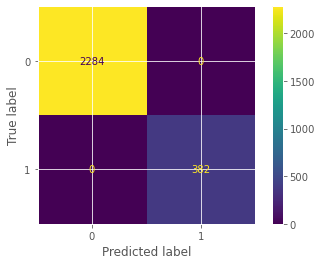

In [184]:
plot_confusion_matrix(pipe_log, X_tr_final, y_train)

## Final LogisticRegression Model
- Now that we have a final model, run X_test through all of the preprocessing steps so we can evaluate the model's performance

In [185]:
X_test.columns

Index(['account length', 'number vmail messages', 'total day minutes',
       'total day calls', 'total day charge', 'total eve minutes',
       'total eve calls', 'total eve charge', 'total night minutes',
       'total night calls',
       ...
       'total intl charge_4.56', 'total intl charge_4.75',
       'total intl charge_5.1', 'customer service calls_1',
       'customer service calls_2', 'customer service calls_3',
       'customer service calls_4', 'customer service calls_5',
       'customer service calls_6', 'customer service calls_7'],
      dtype='object', length=4073)

In [186]:
X_test_num = X_test.drop(['state', 'area code', 'phone number', 'international plan', 'voice mail plan'], axis=1)

KeyError: "['state' 'area code' 'phone number' 'international plan' 'voice mail plan'] not found in axis"

In [ ]:
X_test_cat = X_test_num.drop(['phone number'], axis=1)

In [ ]:
X_test = pd.DataFrame(ss.transform(X_test_cat), index=X_test_cat.index, columns=X_test_cat.columns)

In [187]:




X_test_oh = pd.DataFrame(ohe.transform(X_test_cat), columns=ohe.get_feature_names(X_test_cat.columns), index=X_test_cat.index)
X_test = X_test_num.join(X_test_oh)
X_test

,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,state_AK,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,state_GA,state_HI,state_IA,state_ID,state_IL,state_IN,state_KS,state_KY,state_LA,state_MA,state_MD,state_ME,state_MI,state_MN,state_MO,state_MS,state_MT,state_NC,state_ND,state_NE,state_NH,state_NJ,state_NM,state_NV,state_NY,state_OH,state_OK,state_OR,state_PA,state_RI,state_SC,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,account length_1,account length_3,account length_5,account length_6,account length_7,account length_9,account length_10,account length_11,account length_12,account length_13,account length_15,account length_16,account length_17,account length_18,account length_19,account length_20,account length_21,account length_22,account length_23,account length_24,account length_25,account length_26,account length_27,account length_28,account length_29,account length_30,account length_31,account length_32,account length_33,account length_34,account length_35,account length_36,account length_37,account length_38,account length_39,account length_40,account length_41,account length_42,account length_43,account length_44,account length_45,account length_46,account length_47,account length_48,account length_49,account length_50,account length_51,account length_52,account length_53,account length_54,account length_55,account length_56,account length_57,account length_58,account length_59,account length_60,account length_61,account length_62,account length_63,account length_64,account length_65,account length_66,account length_67,account length_68,account length_69,account length_70,account length_71,account length_72,account length_73,account length_74,account length_75,account length_76,account length_77,account length_78,account length_79,account length_80,account length_81,account length_82,account length_83,account length_84,account length_85,account length_86,account length_87,account length_88,account length_89,account length_90,account length_91,account length_92,account length_93,account length_94,account length_95,account length_96,account length_97,account length_98,account length_99,account length_100,account length_101,account length_102,account length_103,account length_104,account length_105,account length_106,account length_107,account length_108,account length_109,account length_110,account length_111,account length_112,account length_113,account length_114,account length_115,account length_116,account length_117,account length_118,account length_119,account length_120,account length_121,account length_122,account length_123,account length_124,account length_125,account length_126,account length_127,account length_128,account length_129,account length_130,account length_131,account length_132,account length_133,account length_134,account length_135,account length_136,account length_137,account length_138,account length_139,account length_140,account length_141,account length_142,account length_143,account length_144,account length_145,account length_146,account length_147,account length_148,account length_149,account length_150,account length_151,account length_152,account length_153,account length_154,account length_155,account length_156,account length_157,account length_158,account length_159,account length_160,account length_161,account length_162,account length_163,account length_164,account length_165,account length_166,account length_167,account length_168,account length_169,account length_170,account length_171,account length_172,account length_173,account length_174,account length_175,account length_176,account length_177,account length_178,account length_179,account length_180,account length_181,accou

# Second model with RandomForest

In [142]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

param_grid = {'max_depth': [2,5,10],
              'n_estimators': [100, 1000]
}
gs = GridSearchCV(RandomForestClassifier(class_weight='balanced', criterion='entropy'), estimator=pip_log, param_grid=param_grid)
gs.fit(X_tr_final, y_train)

GridSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                              criterion='entropy'),
             param_grid={'max_depth': [2, 5, 10], 'n_estimators': [100, 1000]})

In [143]:
gs.best_estimator_

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=10, n_estimators=1000)

In [144]:
gs.best_score_

0.8833400088538482

In [145]:
from sklearn.metrics import f1_score

y_hat_train = gs.best_estimator_.predict(X_tr_final)
f1_score(y_train, y_hat_train)

0.8136882129277566

In [146]:

recall_score(y_train, y_hat_train)

0.8403141361256544

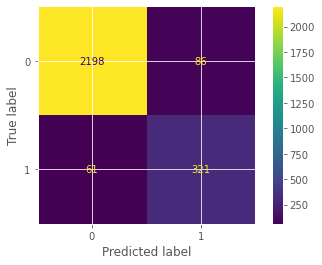

In [147]:
plot_confusion_matrix(gs.best_estimator_, X_tr_final, y_train)